In [1]:
import pandas as pd
import numpy as np

import matplotlib
import matplotlib.pyplot as plt
#%matplotlib inline
#!pip install --upgrade geopandas plotly
import geopandas as gpd
import plotly.express as px
import folium
from shapely.geometry import Point
from shapely.geometry import shape
from shapely.geometry import Polygon
import contextily as cx
from geopandas.tools import sjoin

In [2]:
# ---------------------- GEOPANDAS MEXICO -------------
world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))

In [3]:
states = gpd.read_file('mapa_mexico/Division_Municipal_Mexico_2010.shp')
type(states)

geopandas.geodataframe.GeoDataFrame

<AxesSubplot:>

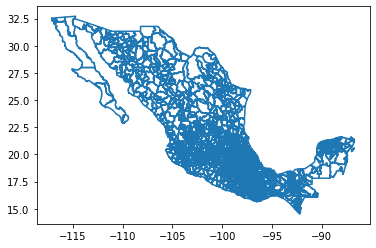

In [4]:
states.boundary.plot()

In [5]:
#------------------------- STATES LOCATION------------------------
df_states_location = states.loc[:, ['Area','geometry']]
df_states_location
#-----------------------------------GAS REGULAR--LOCATION -------------
#df_gas_inegi_regular_final_location = pd.merge(df_inegi_coneval_gas_regular, df_states_location)
#df_gas_inegi_regular_final_location
#------------------------- FIN LOCATION------------------------

,Area,geometry
0,1122.661145,"POLYGON ((-117.09481 32.41141, -117.09481 32.4..."
1,3670.991923,"POLYGON ((-116.73791 32.56703, -116.65926 32.5..."
2,13119.275713,"POLYGON ((-115.81505 32.64088, -115.70466 32.6..."
3,517.120801,"POLYGON ((-117.06254 32.34436, -117.06276 32.3..."
4,9033.770278,"POLYGON ((-114.96166 32.36465, -114.96239 32.3..."
...,...,...
2475,233.070389,"POLYGON ((-92.15077 14.72499, -92.15014 14.723..."
2476,303.371304,"POLYGON ((-96.75636 16.72003, -96.75270 16.719..."
2477,7.201493,"POLYGON ((-96.74966 16.56239, -96.74989 16.562..."
2478,31.195331,"POLYGON ((-96.78255 16.59149, -96.79727 16.605..."


In [6]:
#-------------------------------- GAS REGUlAR INEGI CONEVAL ----------
path7 = 'Gas_Regular_Nacional_Final.csv'
df_gas_regular_nacional_mx = pd.read_csv(path7, index_col=0, sep=',', encoding='latin-1')
df_gas_regular_nacional_mx.rename(columns = {'x':'longitude', 'y':'latitude'}, inplace = True)
#df_gas_regular_nacional_mx.groupby('NOMEDO').mean()

In [7]:
#-------------------------------- GAS PREMIUM INEGI CONEVAL ----------
path8 = 'Gas_Premium_Nacional_Final.csv'
df_gas_premium_nacional_mx = pd.read_csv(path8, index_col=0, sep=',', encoding='latin-1')
df_gas_premium_nacional_mx.rename(columns = {'x':'longitude', 'y':'latitude'}, inplace = True)
#df_gas_premium_nacional_mx.groupby('NOMEDO').mean()

In [8]:
#-------------------------------- DIESEL INEGI CONEVAL ----------
path9 = 'Diesel_Nacional_Final.csv'
df_diesel_nacional_mx = pd.read_csv(path9, index_col=0, sep=',', encoding='latin-1')
df_diesel_nacional_mx.rename(columns = {'x':'longitude', 'y':'latitude'}, inplace = True)
#df_diesel_nacional_mx.groupby('NOMEDO').mean()

In [9]:
from sklearn import preprocessing, cluster
import matplotlib.pyplot as plt
import seaborn as sns
import scipy
from scipy.cluster.vq import vq
import folium
import geopy

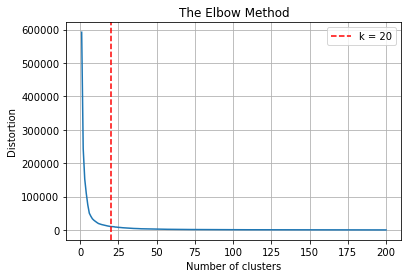

In [11]:
X = df_gas_regular_nacional_mx[["latitude","longitude"]]
max_k = 200
## iterations
distortions = [] 
for i in range(1, max_k+1):
    if len(X) >= i:
       model = cluster.KMeans(n_clusters=i, init='k-means++', max_iter=300, n_init=10, random_state=0)
       model.fit(X)
       distortions.append(model.inertia_)
## best k: the lowest derivative
k = [i*100 for i in np.diff(distortions,2)].index(min([i*100 for i 
     in np.diff(distortions,2)]))
## plot
fig, ax = plt.subplots()
ax.plot(range(1, len(distortions)+1), distortions)
ax.axvline(k, ls='--', color="red", label="k = "+str(k))
ax.set(title='The Elbow Method', xlabel='Number of clusters', 
       ylabel="Distortion")
ax.legend()
ax.grid(True)
plt.show()

In [14]:
k = 20

In [15]:
model = cluster.KMeans(n_clusters=k, init='k-means++')
X = df_gas_regular_nacional_mx[["latitude","longitude"]]
## clustering
dtf_X = X.copy()
dtf_X["cluster"] = model.fit_predict(X)
## find real centroids
closest, distances = vq(model.cluster_centers_, 
                     dtf_X.drop("cluster", axis=1).values)
dtf_X["centroids"] = 0
for i in closest:
    dtf_X["centroids"].iloc[i] = 1
## add clustering info to the original dataset
df_gas_regular_nacional_mx[["cluster","centroids"]] = dtf_X[["cluster","centroids"]]

C:\Users\odie2\AppData\Local\Temp\ipykernel_20344\2631031055.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dtf_X["centroids"].iloc[i] = 1


In [16]:
df_gas_regular_nacional_mx.head()

,place_id,Area,ENTIDAD,MUN,LOC,POBTOT,POBFEM,POBMAS,P_0A2,P_0A2_F,...,pobreza,vul_car,ic_rezedu,ic_asalud,ic_segsoc,ic_cv,ic_sbv,pobreza_e,cluster,centroids
0,2039,1122.661145,2.0,3.906977,1531,4418.367442,2191.265116,2224.618605,175.748837,86.493023,...,29.5,33.1,12.7,21.0,46.3,8.4,7.3,1.8,3,0
1,2044,1122.661145,2.0,3.906977,1531,4418.367442,2191.265116,2224.618605,175.748837,86.493023,...,29.5,33.1,12.7,21.0,46.3,8.4,7.3,1.8,3,0
2,2053,1122.661145,2.0,3.906977,1531,4418.367442,2191.265116,2224.618605,175.748837,86.493023,...,29.5,33.1,12.7,21.0,46.3,8.4,7.3,1.8,3,0
3,2062,1122.661145,2.0,3.906977,1531,4418.367442,2191.265116,2224.618605,175.748837,86.493023,...,29.5,33.1,12.7,21.0,46.3,8.4,7.3,1.8,3,0
4,2064,1122.661145,2.0,3.906977,1531,4418.367442,2191.265116,2224.618605,175.748837,86.493023,...,29.5,33.1,12.7,21.0,46.3,8.4,7.3,1.8,3,0


In [17]:
df_gas_regular_clusters = df_gas_regular_nacional_mx[['name','longitude', 'latitude', 'cluster', 'centroids']]
df_gas_regular_clusters

,name,longitude,latitude,cluster,centroids
0,"ESTACION DE SERVICIO CALAFIA, S.A. DE C.V.",-116.92140,32.47641,3,0
1,"ESTACION RAEL, S. DE R.L. DE C.V.",-117.07150,32.51342,3,0
2,"CIRCULO DOS, S.A. DE C.V.",-117.02710,32.52790,3,0
3,Becktrop Operadora SA de CV,-117.02490,32.45102,3,0
4,"ESTACION LA VICTORIA, S.A. DE C.V.",-117.04660,32.53171,3,0
...,...,...,...,...,...
11401,"Gaseros Punto 314, S.A. de C.V.",-96.68024,17.06580,8,0
11402,"SERVICIO LA PIEDRA CHINA, S.A. DE C.V.",-105.32900,22.63946,12,0
11403,Empresa Creativa S.A. de C.V.,-98.47421,19.58807,11,0
11404,EVERARDO GUSTIN SÁNCHEZ,-97.87665,21.16325,18,0


Text(0.5, 1.0, 'Clustering (k=20)')

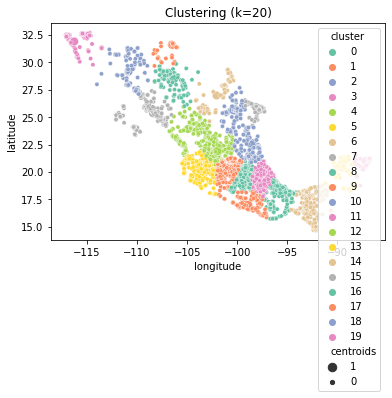

In [18]:
## plot
fig, ax = plt.subplots()
sns.scatterplot(x="longitude", y="latitude", data=df_gas_regular_clusters, 
                palette=sns.color_palette("Set2",k),
                hue='cluster', size="centroids", size_order=[1,0],
                legend="brief", ax=ax).set_title('Clustering (k='+str(k)+')')
#th_centroids = model.cluster_centers_

In [19]:
colors = np.array(*[sns.color_palette("Set2",k)])*255
colors = ["#"+"".join([f'{hex(int(i))[2:]}0'[:2] for i in c]) for c in colors]
colors

['#66c2a5',
 '#fc8d62',
 '#8da0cb',
 '#e78ac3',
 '#a6d854',
 '#ffd92f',
 '#e5c494',
 '#b3b3b3',
 '#66c2a5',
 '#fc8d62',
 '#8da0cb',
 '#e78ac3',
 '#a6d854',
 '#ffd92f',
 '#e5c494',
 '#b3b3b3',
 '#66c2a5',
 '#fc8d62',
 '#8da0cb',
 '#e78ac3']

In [20]:
city = "Mexico"
## get location
locator = geopy.geocoders.Nominatim(user_agent="MyCoder")
location = locator.geocode(city)
print(location)
## keep latitude and longitude only
location = [location.latitude, location.longitude]
print("[lat, long]:", location)

México
[lat, long]: [23.6585116, -102.0077097]


In [21]:
x, y = "latitude", "longitude"
color = "cluster"
size = "Staff"
popup = "name"
marker = "centroids"
data = df_gas_regular_clusters.copy()
## create color column
lst_elements = sorted(list(df_gas_regular_clusters[color].unique()))

data["color"] = data[color].apply(lambda x: 
                colors[lst_elements.index(x)])
## create size column (scaled)
scaler = preprocessing.MinMaxScaler(feature_range=(3,15))
data["size"] = 1
## initialize the map with the starting location
map_ = folium.Map(location=location, tiles="cartodbpositron",
                  zoom_start=11)
## add points
data.apply(lambda row: folium.CircleMarker(
           location=[row[x],row[y]], popup=row[popup],
           color=row["color"], fill=True,
           radius=row["size"]).add_to(map_), axis=1)
## add html legend
legend_html = """<div style="position:fixed; bottom:10px; left:10px; border:2px solid black; z-index:9999; font-size:14px;">&nbsp;<b>"""+color+""":</b><br>"""
for i in lst_elements:
     legend_html = legend_html+"""&nbsp;<i class="fa fa-circle 
     fa-1x" style="color:"""+colors[lst_elements.index(i)]+"""">
     </i>&nbsp;"""+str(i)+"""<br>"""
legend_html = legend_html+"""</div>"""
map_.get_root().html.add_child(folium.Element(legend_html))
## add centroids marker
lst_elements = sorted(list(df_gas_regular_clusters[marker].unique()))
## plot the map
map_

In [35]:
df_gas_regular_nacional_mx.sort_values(by='POBTOT', inplace=True)
df_gas_regular_nacional_mx

,place_id,Area,ENTIDAD,MUN,LOC,POBTOT,POBFEM,POBMAS,P_0A2,P_0A2_F,...,pobreza,vul_car,ic_rezedu,ic_asalud,ic_segsoc,ic_cv,ic_sbv,pobreza_e,cluster,centroids
11375,22378,1566.849108,26.0,22.287500,112,1.072500e+01,4.012500,4.600000,0.200000,0.150000,...,19.1,60.9,27.0,10.7,64.8,4.4,7.5,0.9,8,0
8169,8342,2406.922102,28.0,14.000000,279,1.492857e+01,6.599206,7.230159,0.452381,0.226190,...,54.5,26.3,21.9,14.3,71.3,4.0,7.3,4.8,13,0
8168,3961,2406.922102,28.0,14.000000,279,1.492857e+01,6.599206,7.230159,0.452381,0.226190,...,54.5,26.3,21.9,14.3,71.3,4.0,7.3,4.8,6,0
11374,22290,5020.420253,8.0,41.597403,145,1.531169e+01,6.519481,6.987013,0.389610,0.129870,...,38.9,55.1,40.6,10.9,79.9,1.7,6.3,2.3,10,0
11235,12989,4113.871291,26.0,21.872340,124,1.970213e+01,8.095745,9.478723,0.659574,0.319149,...,23.6,53.4,28.6,18.7,49.8,9.3,18.3,2.4,8,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3807,5898,87.445402,9.0,5.000000,1,1.173351e+06,609477.000000,563874.000000,35261.000000,17306.000000,...,28.4,23.5,9.3,18.5,40.8,4.1,1.5,1.1,17,0
3806,5889,87.445402,9.0,5.000000,1,1.173351e+06,609477.000000,563874.000000,35261.000000,17306.000000,...,28.4,23.5,9.3,18.5,40.8,4.1,1.5,1.1,17,0
3805,5002,87.445402,9.0,5.000000,1,1.173351e+06,609477.000000,563874.000000,35261.000000,17306.000000,...,28.4,23.5,9.3,18.5,40.8,4.1,1.5,1.1,17,0
3817,10351,87.445402,9.0,5.000000,1,1.173351e+06,609477.000000,563874.000000,35261.000000,17306.000000,...,28.4,23.5,9.3,18.5,40.8,4.1,1.5,1.1,17,0


In [ ]:
import plotly as py
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
import plotly.graph_objs as go

In [ ]:
import os
import sys

import geopandas as gpd
import matplotlib.pyplot as plt
import pandas as pd
import requests
import matplotlib_scalebar
from matplotlib_scalebar.scalebar import ScaleBar

In [ ]:
#-----------------------------------GAS REGULAR--LOCATION -------------
df_gas_inegi_regular_final_location = pd.merge(df_gas_regular_nacional_mx, df_states_location)
df_gas_inegi_regular_final_location
#------------------------- FIN LOCATION------------------------

In [ ]:
df_gas_regular_nacional_mx = gpd.GeoDataFrame(
    df_gas_regular_nacional_mx, geometry= gpd.points_from_xy(df_gas_regular_nacional_mx.longitude, df_gas_regular_nacional_mx.latitude))

In [ ]:
ax = states.plot(color='white', edgecolor='black', figsize=(36,24))
cx.add_basemap(ax)

df_gas_regular_nacional_mx.plot(ax=ax, cmap="YlOrRd",column='gas_price')

df_gas_regular_nacional_mx.plot(column ='gas_price', cmap='YlOrRd', ax=ax, legend = True , legend_kwds = {'label': "gas_price", 'orientation': "horizontal"})

plt.show()

In [22]:
from sklearn.model_selection import train_test_split, StratifiedShuffleSplit
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import OrdinalEncoder, OneHotEncoder

In [23]:
train_set, test_set = train_test_split(df_gas_regular_nacional_mx, test_size=0.2, random_state=42)
train_set.shape, test_set.shape

((9124, 244), (2282, 244))

In [24]:
train_set_num = train_set[['pobreza','vul_car','ic_rezedu','ic_asalud','ic_segsoc','ic_cv','ic_sbv','pobreza_e', 'gas_price']]
train_set_num = train_set_num.reset_index(drop=True)
train_set_num.head(5)

,pobreza,vul_car,ic_rezedu,ic_asalud,ic_segsoc,ic_cv,ic_sbv,pobreza_e,gas_price
0,26.8,34.3,11.6,15.4,40.2,5.9,4.6,1.4,21.99
1,75.2,18.6,25.7,10.9,82.3,4.5,30.4,13.6,22.13
2,19.6,26.8,9.3,8.6,33.5,2.2,1.1,0.6,21.59
3,54.1,36.0,16.1,8.5,76.3,20.7,58.9,10.8,20.99
4,39.2,23.1,10.3,15.4,53.2,4.9,1.3,1.3,22.69


In [30]:
imputer = SimpleImputer(strategy="median")
imputer.fit(train_set_num)

SimpleImputer(strategy='median')

In [33]:
X = imputer.transform(train_set_num)
train_set_tr = pd.DataFrame(X, columns=train_set_num.columns)

In [34]:
train_ind = train_set_tr['gas_price']
train_ind = train_ind.to_frame().to_numpy()

In [35]:
train_ind.shape

(9124, 1)

In [36]:
train_set_tr = train_set_tr.drop(columns=['gas_price'])
train_set_tr

,pobreza,vul_car,ic_rezedu,ic_asalud,ic_segsoc,ic_cv,ic_sbv,pobreza_e
0,26.8,34.3,11.6,15.4,40.2,5.9,4.6,1.4
1,75.2,18.6,25.7,10.9,82.3,4.5,30.4,13.6
2,19.6,26.8,9.3,8.6,33.5,2.2,1.1,0.6
3,54.1,36.0,16.1,8.5,76.3,20.7,58.9,10.8
4,39.2,23.1,10.3,15.4,53.2,4.9,1.3,1.3
...,...,...,...,...,...,...,...,...
9119,54.3,36.8,28.9,12.0,72.2,5.7,16.4,2.1
9120,37.3,32.4,15.0,10.6,53.9,15.0,22.4,5.7
9121,33.2,29.6,15.6,24.0,45.0,11.1,3.7,3.6
9122,33.5,37.1,17.9,14.5,54.2,12.6,27.9,3.5


In [37]:
train_set_tr.to_numpy()

array([[26.8, 34.3, 11.6, ...,  5.9,  4.6,  1.4],
       [75.2, 18.6, 25.7, ...,  4.5, 30.4, 13.6],
       [19.6, 26.8,  9.3, ...,  2.2,  1.1,  0.6],
       ...,
       [33.2, 29.6, 15.6, ..., 11.1,  3.7,  3.6],
       [33.5, 37.1, 17.9, ..., 12.6, 27.9,  3.5],
       [56.7, 37.4, 24.6, ..., 28.6, 71.6, 11.4]])

In [38]:
rows, cols = train_set_tr.shape
rows

9124

In [40]:
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score, mean_squared_error

In [42]:
X_b = np.c_[np.ones((rows, 1)), train_set_tr]

In [44]:
X_b.shape

(9124, 9)

In [45]:
X_b.T.dot(X_b)

array([[9.12400000e+03, 3.58719300e+05, 2.60664300e+05, 1.53400200e+05,
        1.49149500e+05, 4.82615400e+05, 8.96674000e+04, 1.42737500e+05,
        4.87971000e+04],
       [3.58719300e+05, 1.66716359e+07, 9.81710802e+06, 6.90298703e+06,
        5.94488102e+06, 2.13431923e+07, 4.25857941e+06, 7.69846685e+06,
        2.74486813e+06],
       [2.60664300e+05, 9.81710802e+06, 7.86697283e+06, 4.36478702e+06,
        4.26973193e+06, 1.37199999e+07, 2.48605148e+06, 3.94847251e+06,
        1.22015267e+06],
       [1.53400200e+05, 6.90298703e+06, 4.36478702e+06, 3.08780330e+06,
        2.50540654e+06, 9.00396614e+06, 1.78951525e+06, 3.27828700e+06,
        1.11887950e+06],
       [1.49149500e+05, 5.94488102e+06, 4.26973193e+06, 2.50540654e+06,
        2.69904527e+06, 8.01682173e+06, 1.50774780e+06, 2.28719415e+06,
        8.18524730e+05],
       [4.82615400e+05, 2.13431923e+07, 1.37199999e+07, 9.00396614e+06,
        8.01682173e+06, 2.82015136e+07, 5.41847086e+06, 9.59523828e+06,
        3.3

In [46]:
X_b.shape, train_ind.shape

((9124, 9), (9124, 1))

In [43]:
# Crea objeto para transformar
poly_features = PolynomialFeatures(degree=2, include_bias=False)

# Transforma conjunto de datos con el objeto para transformar
X_poly = poly_features.fit_transform(X_b)

# Imprime comparativa entre dato original y dato tranformado
print(X_b[0])
print(X_poly[0])

[ 1.  26.8 34.3 11.6 15.4 40.2  5.9  4.6  1.4]
[1.00000e+00 2.68000e+01 3.43000e+01 1.16000e+01 1.54000e+01 4.02000e+01
 5.90000e+00 4.60000e+00 1.40000e+00 1.00000e+00 2.68000e+01 3.43000e+01
 1.16000e+01 1.54000e+01 4.02000e+01 5.90000e+00 4.60000e+00 1.40000e+00
 7.18240e+02 9.19240e+02 3.10880e+02 4.12720e+02 1.07736e+03 1.58120e+02
 1.23280e+02 3.75200e+01 1.17649e+03 3.97880e+02 5.28220e+02 1.37886e+03
 2.02370e+02 1.57780e+02 4.80200e+01 1.34560e+02 1.78640e+02 4.66320e+02
 6.84400e+01 5.33600e+01 1.62400e+01 2.37160e+02 6.19080e+02 9.08600e+01
 7.08400e+01 2.15600e+01 1.61604e+03 2.37180e+02 1.84920e+02 5.62800e+01
 3.48100e+01 2.71400e+01 8.26000e+00 2.11600e+01 6.44000e+00 1.96000e+00]


In [47]:
print(X_b.shape)
print(X_poly.shape)

(9124, 9)
(9124, 54)


In [48]:
# Crea objeto de regresión lineal
lin_reg = LinearRegression()

In [49]:
# Ajusta modelo de regresión lineal
lin_reg.fit(X_poly, train_ind)

# Devuelve intercepto y coeficientes de modelo de regresión linea
lin_reg.intercept_, lin_reg.coef_

(array([24.69480557]),
 array([[ 4.88897923e-16, -1.66383670e-01, -1.14527951e-01,
          8.73885272e-02,  7.02515017e-02,  9.19615273e-02,
         -1.68994369e-01,  6.60680981e-02,  6.94766468e-02,
          9.00321484e-15, -1.66383670e-01, -1.14527951e-01,
          8.73885272e-02,  7.02515017e-02,  9.19615273e-02,
         -1.68994369e-01,  6.60680981e-02,  6.94766468e-02,
          3.92839497e-03,  1.07077977e-02, -1.16375015e-02,
         -9.78111797e-03, -1.19809793e-03,  3.43885083e-03,
         -4.14685938e-04,  2.92947314e-03,  6.04355095e-03,
         -8.51550369e-03, -1.07332385e-02, -5.91943393e-03,
          6.94602198e-03, -2.53317427e-03,  4.38950922e-03,
          3.05620509e-03,  8.65494506e-04,  7.95101453e-03,
         -4.32765206e-03,  1.46728812e-03,  1.72377732e-03,
          7.80886198e-04,  8.80471963e-03,  2.13573956e-03,
         -2.96135797e-05, -2.59159465e-03, -1.37924876e-03,
         -9.22208372e-05, -6.06937135e-04, -5.04923427e-03,
          1.02439

In [50]:
modelo = lin_reg.coef_
modelo.shape

(1, 54)

In [51]:
modelo = lin_reg.coef_
modelo.shape

(1, 54)

In [53]:
test_set_cat = test_set[['pobreza','vul_car','ic_rezedu','ic_asalud','ic_segsoc','ic_cv','ic_sbv','pobreza_e', 'gas_price']]
cat_encoder = OneHotEncoder()
gas_cat_1hot = cat_encoder.fit_transform(test_set_cat)
gas_cat_1hot

<2282x2880 sparse matrix of type '<class 'numpy.float64'>'
	with 20538 stored elements in Compressed Sparse Row format>

In [55]:
gas_cat_1hot.toarray()

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

In [56]:
import scipy.sparse
gas_cat_1hot = pd.DataFrame.sparse.from_spmatrix(gas_cat_1hot)

In [57]:
gas_cat_1hot['index'] = gas_cat_1hot.index
gas_cat_1hot.head(5)

,0,1,2,3,4,5,6,7,8,9,...,2871,2872,2873,2874,2875,2876,2877,2878,2879,index
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4


In [58]:
imputer = SimpleImputer(strategy="median")
imputer.fit(test_set_cat)
imputer.statistics_

array([34.9 , 28.4 , 14.3 , 15.45, 47.9 ,  7.7 ,  8.1 ,  3.  , 21.35])

In [60]:
test_set_cat.median().values

array([34.9 , 28.4 , 14.3 , 15.45, 47.9 ,  7.7 ,  8.1 ,  3.  , 21.35])

In [63]:
X = imputer.transform(test_set_cat)
test_set_tr = pd.DataFrame(X, columns=test_set_cat.columns)

In [64]:
test_ind = test_set_tr['gas_price']
test_ind = test_ind.to_frame().to_numpy()

In [65]:
test_ind.shape

(2282, 1)

In [66]:
test_set_tr = test_set_tr.drop(columns=['gas_price'])
test_set_tr

,pobreza,vul_car,ic_rezedu,ic_asalud,ic_segsoc,ic_cv,ic_sbv,pobreza_e
0,27.7,20.8,6.7,21.9,37.2,3.3,2.8,2.8
1,27.7,35.8,13.7,19.3,43.9,12.9,9.1,2.6
2,59.1,23.0,17.6,14.8,73.0,15.2,11.0,5.9
3,39.7,39.5,13.7,26.0,71.9,7.0,13.9,3.5
4,25.7,31.8,11.6,15.4,41.4,8.3,10.1,1.7
...,...,...,...,...,...,...,...,...
2277,37.2,38.6,20.8,16.3,56.9,7.4,24.2,5.5
2278,40.6,26.3,11.7,20.0,52.9,6.3,8.0,3.8
2279,38.8,32.0,18.3,8.2,53.7,8.1,9.7,3.2
2280,19.4,31.1,10.1,11.7,31.0,5.6,4.5,1.4


In [67]:
test_set_tr.to_numpy()

array([[27.7, 20.8,  6.7, ...,  3.3,  2.8,  2.8],
       [27.7, 35.8, 13.7, ..., 12.9,  9.1,  2.6],
       [59.1, 23. , 17.6, ..., 15.2, 11. ,  5.9],
       ...,
       [38.8, 32. , 18.3, ...,  8.1,  9.7,  3.2],
       [19.4, 31.1, 10.1, ...,  5.6,  4.5,  1.4],
       [30. , 27.9, 10.7, ...,  8. ,  5. ,  2.2]])

In [68]:
rows, cols = test_set_tr.shape
Y_b = np.c_[np.ones((rows, 1)), test_set_tr]

In [69]:
# Crea objeto para transformar
poly_features = PolynomialFeatures(degree=2, include_bias=False)

# Transforma conjunto de datos con el objeto para transformar
Y_poly = poly_features.fit_transform(Y_b)

# Imprime comparativa entre dato original y dato tranformado
print(Y_b[0])
print(Y_poly[0])

[ 1.  27.7 20.8  6.7 21.9 37.2  3.3  2.8  2.8]
[1.00000e+00 2.77000e+01 2.08000e+01 6.70000e+00 2.19000e+01 3.72000e+01
 3.30000e+00 2.80000e+00 2.80000e+00 1.00000e+00 2.77000e+01 2.08000e+01
 6.70000e+00 2.19000e+01 3.72000e+01 3.30000e+00 2.80000e+00 2.80000e+00
 7.67290e+02 5.76160e+02 1.85590e+02 6.06630e+02 1.03044e+03 9.14100e+01
 7.75600e+01 7.75600e+01 4.32640e+02 1.39360e+02 4.55520e+02 7.73760e+02
 6.86400e+01 5.82400e+01 5.82400e+01 4.48900e+01 1.46730e+02 2.49240e+02
 2.21100e+01 1.87600e+01 1.87600e+01 4.79610e+02 8.14680e+02 7.22700e+01
 6.13200e+01 6.13200e+01 1.38384e+03 1.22760e+02 1.04160e+02 1.04160e+02
 1.08900e+01 9.24000e+00 9.24000e+00 7.84000e+00 7.84000e+00 7.84000e+00]


In [70]:
Y_b.shape, Y_poly.shape

((2282, 9), (2282, 54))

In [71]:
Y_modelo = np.dot(Y_poly, lin_reg.coef_.T)
Y_modelo

array([[-3.08347473],
       [-3.74674165],
       [-3.71671067],
       ...,
       [-3.22620814],
       [-3.31572745],
       [-3.37584939]])

In [72]:
Y_masIntercepto = lin_reg.intercept_ + Y_modelo
Y_masIntercepto

array([[21.61133084],
       [20.94806392],
       [20.9780949 ],
       ...,
       [21.46859743],
       [21.37907812],
       [21.31895618]])

In [74]:
# ECM
ECM = ((Intercepto-test_ind)**2).mean()
ECM

1.667862700013678